In [1]:
# importing the imp. libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')


In [2]:
# importing the data sets
main_data = pd.read_csv("G:/DataSets/Seattle Accident Data/Data-Collisions.csv")
print("data is imported")

data is imported


In [3]:
main_data.head()

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


In [4]:
# sahpe of data
main_data.shape

(194673, 38)

In [5]:
# name of columns
main_data.columns

Index(['SEVERITYCODE', 'X', 'Y', 'OBJECTID', 'INCKEY', 'COLDETKEY', 'REPORTNO',
       'STATUS', 'ADDRTYPE', 'INTKEY', 'LOCATION', 'EXCEPTRSNCODE',
       'EXCEPTRSNDESC', 'SEVERITYCODE.1', 'SEVERITYDESC', 'COLLISIONTYPE',
       'PERSONCOUNT', 'PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT', 'INCDATE',
       'INCDTTM', 'JUNCTIONTYPE', 'SDOT_COLCODE', 'SDOT_COLDESC',
       'INATTENTIONIND', 'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND',
       'PEDROWNOTGRNT', 'SDOTCOLNUM', 'SPEEDING', 'ST_COLCODE', 'ST_COLDESC',
       'SEGLANEKEY', 'CROSSWALKKEY', 'HITPARKEDCAR'],
      dtype='object')

In [6]:
# cleaning and transforming the data
feature_data = main_data[["SEVERITYCODE","INATTENTIONIND","UNDERINFL","WEATHER","ROADCOND","LIGHTCOND","SPEEDING"]]

In [7]:
feature_data.head()

,SEVERITYCODE,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING
0,2,NaN,N,Overcast,Wet,Daylight,NaN
1,1,NaN,0,Raining,Wet,Dark - Street Lights On,NaN
2,1,NaN,0,Overcast,Dry,Daylight,NaN
3,1,NaN,N,Clear,Dry,Daylight,NaN
4,2,NaN,0,Raining,Wet,Daylight,NaN


In [8]:
feature_data["SPEEDING"].value_counts()

Y    9333
Name: SPEEDING, dtype: int64

In [9]:
# 0 = car wasn't speeding, 1 = car was speeding
feature_data["SPEEDING"].replace(np.nan, 0, inplace = True)
feature_data["SPEEDING"].replace("Y", 1, inplace = True)

In [10]:
feature_data["INATTENTIONIND"].value_counts() #replace(np.nan, )

Y    29805
Name: INATTENTIONIND, dtype: int64

In [11]:
# 0 = drvier was attention, 1 = driver wasn't attention
feature_data["INATTENTIONIND"].replace(np.nan, 0, inplace = True)
feature_data["INATTENTIONIND"].replace("Y", 1, inplace = True)

In [12]:
feature_data["UNDERINFL"].value_counts()

N    100274
0     80394
Y      5126
1      3995
Name: UNDERINFL, dtype: int64

In [13]:
# 0 = driver wasn't drunk, 1 = driver was drunk
feature_data["UNDERINFL"].replace("N", 0, inplace = True)
feature_data["UNDERINFL"].replace("Y", 1, inplace  = True)
feature_data["UNDERINFL"].replace(np.nan, 0, inplace = True)


In [14]:
feature_data["WEATHER"].value_counts()

Clear                       111135
Raining                      33145
Overcast                     27714
Unknown                      15091
Snowing                        907
Other                          832
Fog/Smog/Smoke                 569
Sleet/Hail/Freezing Rain       113
Blowing Sand/Dirt               56
Severe Crosswind                25
Partly Cloudy                    5
Name: WEATHER, dtype: int64

In [15]:
# 0 = clear, 1 = windy, 2 = rain & cloudy,3 = Snowing, 4 = unknown & others
feature_data["WEATHER"].replace("Clear", 0, inplace = True)
feature_data["WEATHER"].replace("Raining", 2, inplace = True)
feature_data["WEATHER"].replace("Overcast", 2, inplace = True)
feature_data["WEATHER"].replace("Snowing", 3, inplace = True)
feature_data["WEATHER"].replace("Other", 4, inplace = True)
feature_data["WEATHER"].replace("Fog/Smog/Smoke", 2, inplace = True)
feature_data["WEATHER"].replace("Sleet/Hail/Freezing Rain", 3, inplace = True)
feature_data["WEATHER"].replace("Blowing Sand/Dirt", 1, inplace = True)
feature_data["WEATHER"].replace("Severe Crosswind", 1, inplace = True)
feature_data["WEATHER"].replace("Partly Cloudy", 0, inplace = True)
feature_data["WEATHER"].replace("Unknown", 4, inplace = True)


In [16]:
feature_data["ROADCOND"].value_counts()

Dry               124510
Wet                47474
Unknown            15078
Ice                 1209
Snow/Slush          1004
Other                132
Standing Water       115
Sand/Mud/Dirt         75
Oil                   64
Name: ROADCOND, dtype: int64

In [17]:
# 0 = dry, 1 = mix, 2 = wet, 3 = unknown
feature_data["ROADCOND"].replace("Dry", 0, inplace = True)
feature_data["ROADCOND"].replace("Wet", 2, inplace = True)
feature_data["ROADCOND"].replace("Ice", 2, inplace = True)
feature_data["ROADCOND"].replace("Snow/Slush", 1, inplace = True)
feature_data["ROADCOND"].replace("Other", 3, inplace = True)
feature_data["ROADCOND"].replace("Standing Water", 1, inplace = True)
feature_data["ROADCOND"].replace("Sand/Mud/Dirt", 1, inplace = True)
feature_data["ROADCOND"].replace("Oil", 2, inplace = True)
feature_data["ROADCOND"].replace("Unknown", 3, inplace = True)


In [18]:
feature_data["LIGHTCOND"].value_counts()

Daylight                    116137
Dark - Street Lights On      48507
Unknown                      13473
Dusk                          5902
Dawn                          2502
Dark - No Street Lights       1537
Dark - Street Lights Off      1199
Other                          235
Dark - Unknown Lighting         11
Name: LIGHTCOND, dtype: int64

In [19]:
# 0 = light, 1 = medium & 2 = dark, 3 = unknown
feature_data["LIGHTCOND"].replace("Daylight", 0, inplace = True)
feature_data["LIGHTCOND"].replace("Dark - Street Lights On", 0, inplace = True)
feature_data["LIGHTCOND"].replace("Dusk", 1, inplace = True)
feature_data["LIGHTCOND"].replace("Dawn", 1, inplace = True)
feature_data["LIGHTCOND"].replace("Dark - No Street Lights", 2, inplace = True)
feature_data["LIGHTCOND"].replace("Dark - Street Lights Off", 2, inplace = True)
feature_data["LIGHTCOND"].replace("Other", 3, inplace = True)
feature_data["LIGHTCOND"].replace("Dark - Unknown Lighting", 2, inplace = True)
feature_data["LIGHTCOND"].replace("Unknown", 3, inplace = True)


In [20]:
feature_data.head()

,SEVERITYCODE,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING
0,2,0,0,2.0,2.0,0.0,0
1,1,0,0,2.0,2.0,0.0,0
2,1,0,0,2.0,0.0,0.0,0
3,1,0,0,0.0,0.0,0.0,0
4,2,0,0,2.0,2.0,0.0,0


In [21]:
# Undersatanding the data through visualisation

In [22]:
# finding on which weather condition the most accident happens. 

In [23]:
weather = feature_data["WEATHER"].value_counts()
weather

0.0    111140
2.0     61428
4.0     15923
3.0      1020
1.0        81
Name: WEATHER, dtype: int64

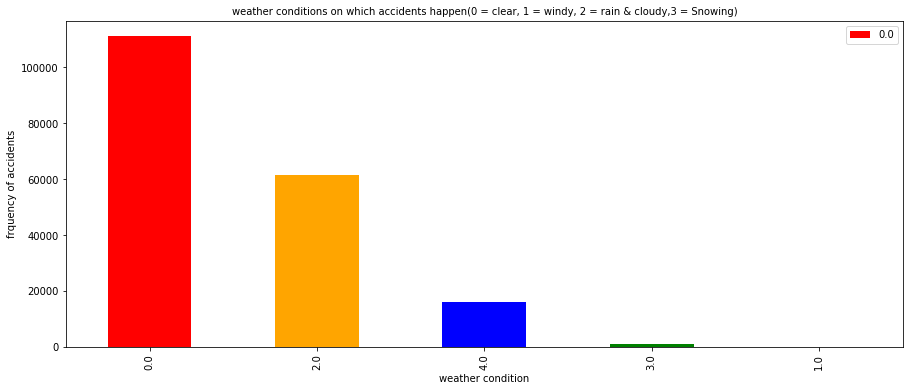

In [24]:
weather.plot(kind = 'bar', figsize = (15, 6), color = ["red", "orange", "blue","green","pink"])
plt.title("weather conditions on which accidents happen(0 = clear, 1 = windy, 2 = rain & cloudy,3 = Snowing)", fontsize = 10)
plt.xlabel("weather condition")
plt.ylabel("frquency of accidents")
plt.legend(labels = weather.index, loc = 'upper right')
plt.show()

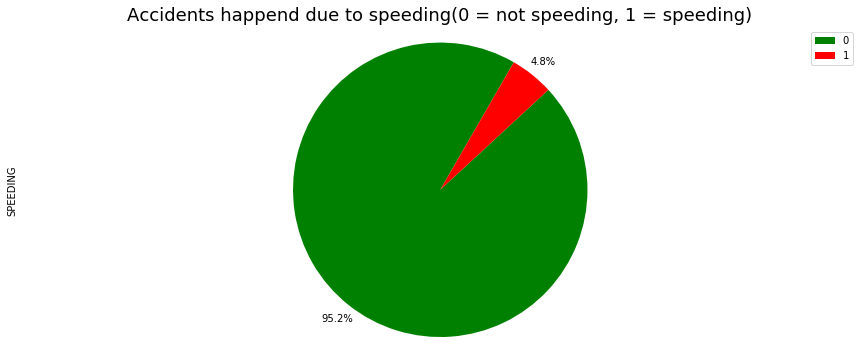

In [25]:
# no of accidents caused by speeding
speeding = feature_data["SPEEDING"].value_counts()
speeding.plot(kind = 'pie', figsize = (15, 6), colors = ["green", "red"], startangle = 60, shadow = False, pctdistance = 1.12, autopct = '%1.1f%%', labels = None)
plt.title("Accidents happend due to speeding(0 = not speeding, 1 = speeding)", fontsize = 18)
plt.axis("equal")
plt.legend(labels = speeding.index, loc = 'upper right')
plt.show()

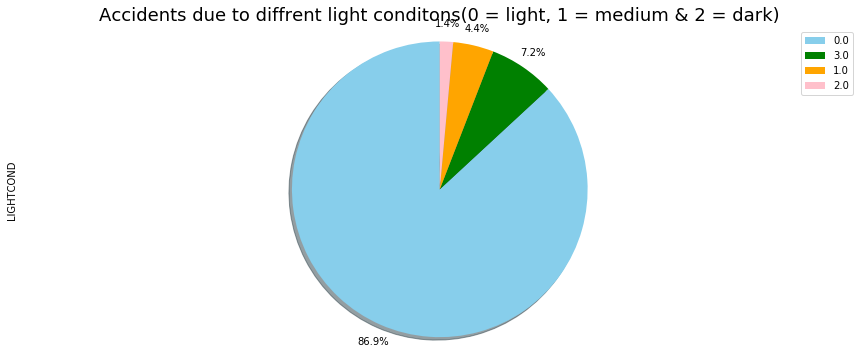

In [26]:
# Accidents happends on diffrent light conditions
light = feature_data["LIGHTCOND"].value_counts()
light.plot(kind = 'pie', figsize = (15, 6), colors = ["skyblue","green","orange","pink"], startangle = 90, shadow = True, pctdistance = 1.12, autopct = '%1.1f%%', labels = None)
plt.title("Accidents due to diffrent light conditons(0 = light, 1 = medium & 2 = dark)", fontsize = 18)
plt.axis("equal")
plt.legend(labels = light.index, loc = 'upper right')
plt.show()

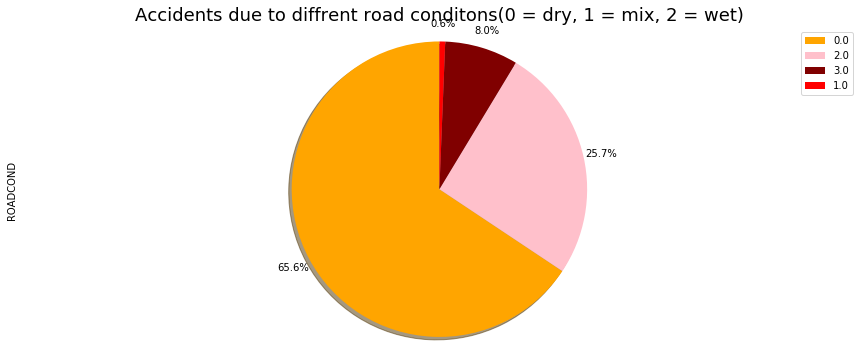

In [27]:
road = feature_data["ROADCOND"].value_counts()
road.plot(kind = 'pie', figsize = (15, 6), colors = ["orange","pink","maroon","red"], startangle = 90, shadow = True, pctdistance = 1.12, autopct = '%1.1f%%', labels = None)
plt.title("Accidents due to diffrent road conditons(0 = dry, 1 = mix, 2 = wet)", fontsize = 18)
plt.axis("equal")
plt.legend(labels = road.index, loc = 'upper right')
plt.show()

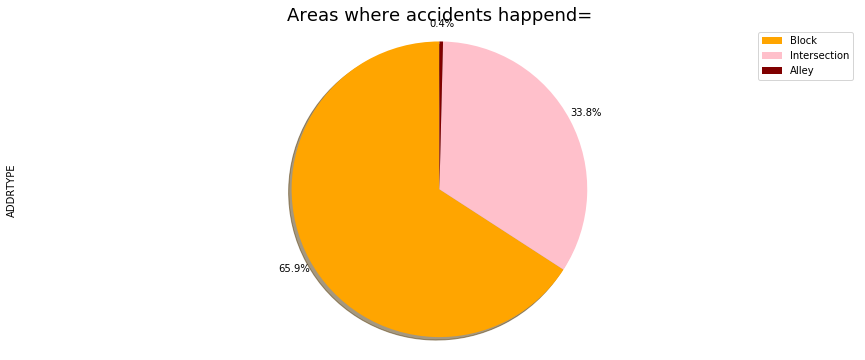

In [28]:
# Area where accidents were happened.
area = main_data["ADDRTYPE"].value_counts()
area.plot(kind = 'pie', figsize = (15, 6), colors = ["orange","pink","maroon","red"], startangle = 90, shadow = True, pctdistance = 1.12, autopct = '%1.1f%%', labels = None)
plt.title("Areas where accidents happend=", fontsize = 18)
plt.axis("equal")
plt.legend(labels = area.index, loc = 'upper right')
plt.show()

In [7]:
# Area where the Accidents were happened.
# importing folium 
import folium
seatle_map = folium.Map(location = [47.61536892, -122.3302243], zoom_start = 12)

In [8]:
limit = 50000
limited_data = main_data.iloc[0:limit:5, 0:] 
map_data = limited_data[["SEVERITYCODE","X","Y"]]

map_data = map_data.dropna()

In [9]:
# mark cluster for accidents
from folium import plugins
accidents = plugins.MarkerCluster().add_to(seatle_map)

#adding the road accidents to the map
for lat, lng, label, in zip(map_data.Y, map_data.X, map_data.SEVERITYCODE):
    if label == 1:
        folium.Marker([lat, lng], icon = folium.Icon(color='blue'), popup = label).add_to(accidents)
    else:
        folium.Marker([lat, lng], icon = folium.Icon(color='red'), popup = label).add_to(accidents)
    
seatle_map.add_child(accidents)
#folium.Layer_Control().add_to(seatle_map)
seatle_map

In [30]:
# droping the Nan values.
feature_data = feature_data.dropna()


In [31]:
# spliting the data into dependent variable and indipendent variable
x = feature_data[["INATTENTIONIND","UNDERINFL","WEATHER","ROADCOND","LIGHTCOND","SPEEDING"]]
x.head()

,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING
0,0,0,2.0,2.0,0.0,0
1,0,0,2.0,2.0,0.0,0
2,0,0,2.0,0.0,0.0,0
3,0,0,0.0,0.0,0.0,0
4,0,0,2.0,2.0,0.0,0


In [32]:
x.shape

(189337, 6)

In [33]:
# making the data type integer
x["LIGHTCOND"] = x["LIGHTCOND"].astype(int)
x["ROADCOND"] = x["ROADCOND"].astype(int)
x["WEATHER"] = x["WEATHER"].astype(int)
x.head()

,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING
0,0,0,2,2,0,0
1,0,0,2,2,0,0
2,0,0,2,0,0,0
3,0,0,0,0,0,0
4,0,0,2,2,0,0


In [34]:
# Target variable
y = feature_data[["SEVERITYCODE"]]
y.head()

,SEVERITYCODE
0,2
1,1
2,1
3,1
4,2


In [35]:
# encoding the target varibale
from sklearn.preprocessing import LabelEncoder, StandardScaler
labelencoder = LabelEncoder()
y = labelencoder.fit_transform(y)
y,y.shape

(array([1, 0, 0, ..., 1, 1, 0], dtype=int64), (189337,))

In [36]:
x["WEATHER"] = labelencoder.fit_transform(x["WEATHER"])
x["ROADCOND"] = labelencoder.fit_transform(x["ROADCOND"])
x["LIGHTCOND"] = labelencoder.fit_transform(x["LIGHTCOND"])
x["SPEEDING"] = labelencoder.fit_transform(x["SPEEDING"])

In [37]:
# applying principal componenets analysis to the training data
from sklearn.decomposition import PCA
pca = PCA(n_components = 6)

In [38]:
# spliting the data into train test data
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

In [39]:
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.fit_transform(x_test)

In [40]:
#fitting the training data to the PCA
x_train = pca.fit_transform(x_train)
x_test = pca.fit_transform(x_test)
explained_variance = pca.explained_variance_ratio_
explained_variance

array([0.36271878, 0.18707818, 0.16047961, 0.15206026, 0.10481416,
       0.03284901])

In [41]:
# creating the logistic regresson model
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()

In [42]:
# fitting the model
lr.fit(x_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [43]:
y_pred_lr = lr.predict(x_test)

In [44]:
#confusion matrix
from sklearn.metrics import confusion_matrix
cm_lr = confusion_matrix(y_test, y_pred_lr)
cm_lr

array([[26395,     3],
       [11466,     4]], dtype=int64)

In [45]:
# importing accuracy metrices
from sklearn.metrics import jaccard_score, f1_score, log_loss, accuracy_score

In [46]:
f1_lr = f1_score(y_test, y_pred_lr)
f1_lr

0.0006970462664459354

In [47]:
acc_lr = accuracy_score(y_test, y_pred_lr)
print("accuracy",accuracy_score(y_test, y_pred_lr))

accuracy 0.6971321432343932


In [48]:
# Applying k-Fold Cross Validation
from sklearn.model_selection import cross_val_score


In [49]:
accuracies = cross_val_score(estimator = lr, X = x_train, y = y_train, cv = 10)
acc_m, acc_std = accuracies.mean(),accuracies.std()
print(acc_m,acc_std)

0.6990407270773795 7.025614258987185e-05


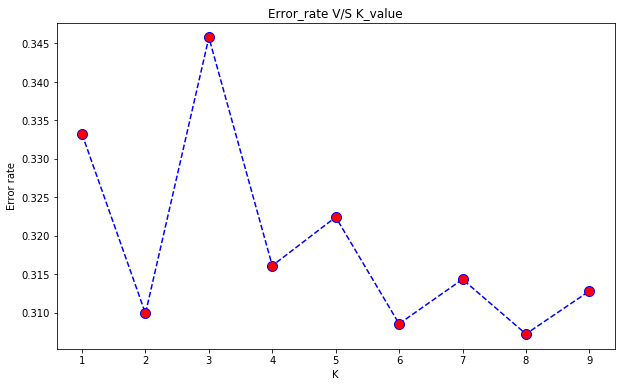

Minium error: 0.3072515052286891 at K =  7


In [55]:
# Building K-N-N model
from sklearn.neighbors import KNeighborsClassifier
error_rate = []
for i in range(1,10):
    knn = KNeighborsClassifier(n_neighbors = i)
    knn.fit(x_train, y_train)
    y_pred_knn = knn.predict(x_test)
    error_rate.append(np.mean(y_pred_knn != y_test))

plt.figure(figsize = (10,6))
plt.plot(range(1,10), error_rate, color = 'blue', linestyle = 'dashed', marker = 'o', markerfacecolor = 'red', markersize = 10)
plt.title("Error_rate V/S K_value")
plt.xlabel("K")
plt.ylabel("Error rate")
plt.show()
print("Minium error:",min(error_rate),"at K = ",error_rate.index(min(error_rate)))

In [60]:
knn_2 = KNeighborsClassifier(n_neighbors = 8)
knn_2.fit(x_train, y_train)
y_pred_knn_2 = knn_2.predict(x_test)


In [61]:
# making confusion matirix
cm_knn = confusion_matrix(y_test, y_pred_knn_2)
cm_knn

array([[25960,   438],
       [11197,   273]], dtype=int64)

In [62]:
#f1_score for knn model
f1_knn = f1_score(y_test, y_pred_knn_2)
f1_knn

0.0448239060832444

In [63]:
# accuracy score for KNN model
acc_knn = accuracy_score(y_test, y_pred_knn_2)
acc_knn

0.6927484947713108

In [50]:
# building the Decision tree model
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier(criterion = "entropy", max_depth = 6)
dtc.fit(x_test, y_test)
y_pred_dtc = dtc.predict(x_test)

In [51]:
#confusion matrix for DTC
cm_dtc = confusion_matrix(y_test, y_pred_dtc)
cm_dtc

array([[26288,   110],
       [11329,   141]], dtype=int64)

In [52]:
# f1_score for DTC moddel
f1_dtc = f1_score(y_test, y_pred_dtc)
f1_dtc

0.024059380598925005

In [53]:
acc_dtc = accuracy_score(y_test, y_pred_dtc)
print("accuracy of dtc model:",accuracy_score(y_test, y_pred_dtc))

accuracy of dtc model: 0.6979243688602514


In [64]:
# Score of diffrent models
model_score = {'f1_score':[f1_lr, f1_knn,f1_dtc], 'accuracy_score':[acc_lr, acc_knn, acc_dtc]}
Models_score = pd.DataFrame(model_score, index = ['lr_model', 'KNN_model', 'dtc_model'])
Models_score

,f1_score,accuracy_score
lr_model,0.000697,0.697132
KNN_model,0.044824,0.692748
dtc_model,0.024059,0.697924
